<a href="https://colab.research.google.com/github/ZZnvm/ENVSCI-794_Zihao/blob/main/VRP_multiV_oneD_iteration1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi depot VRP (Acuakland region)

we will still use the fake customer data for the Step 2 model simulation

Input data: 250 customer points;
5 depots points;
simple veheicle data with speed (to quantify the time later).


In [ ]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Load the new data
df = pd.read_excel("/content/newmarket_data_example.xlsx")  # or CSV

# Rename if you prefer
df = df.rename(columns={"X": "lat", "Y": "lon"})

# Center of all customers
center_lat = df["lat"].mean()
center_lon = df["lon"].mean()

m = folium.Map(location=[center_lat, center_lon],
               zoom_start=10,
               tiles="OpenStreetMap")

cluster = MarkerCluster().add_to(m)

for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=4,
        fill=True,
        popup=f"Customer {row['location']} ({row['suburb']})",
        tooltip=f"{row['suburb']}"
    ).add_to(cluster)

m  # show map


In [4]:
# Install packages
%pip install -q pyvrp folium openpyxl
%pip install "osmnx==1.9.4"
import numpy as np
import pandas as pd
import networkx as nx
import osmnx as ox
import folium

from pyvrp import Model
from pyvrp.stop import MaxIterations




In [7]:
# OSMnx settings: cache requests, see logs in console
ox.settings.use_cache = True
ox.settings.log_console = True

# Path to Excel file
EXCEL_PATH = "/content/newmarket_data_example.xlsx"

# VRP settings
NUM_VEHICLES = 3
VEHICLE_CAPACITY = 40


In [8]:
# ============================================
# Step 2: Load customer data and create a depot
# ============================================
df = pd.read_excel(EXCEL_PATH)

# File has columns: location, suburb, X, Y
# Here X = latitude (~ -36.87), Y = longitude (~ 174.78)
df = df.rename(columns={"X": "lat", "Y": "lon"})

# If the file already contains a depot row (location == 0), keep it.
# Otherwise, create a depot at the centroid of all customers.
if (df["location"] == 0).any():
    df_all = df.sort_values("location").reset_index(drop=True)
else:
    depot_lat = df["lat"].mean()
    depot_lon = df["lon"].mean()

    depot_row = pd.DataFrame(
        {
            "location": [0],
            "suburb": ["Depot-Newmarket"],
            "lat": [depot_lat],
            "lon": [depot_lon],
        }
    )

    df_all = pd.concat([depot_row, df], ignore_index=True)

n_locs = len(df_all)
print(f"Total locations (including depot): {n_locs} = 1 depot + {n_locs - 1} customers")
print(df_all.head())


Total locations (including depot): 101 = 1 depot + 100 customers
   location           suburb        lat         lon
0         0  Depot-Newmarket -36.870025  174.779760
1         1        Newmarket -36.877290  174.777320
2         2        Newmarket -36.862243  174.775596
3         3        Newmarket -36.861348  174.787630
4         4        Newmarket -36.871089  174.773334


In [17]:
# ============================================
# Step 3: Download Newmarket road network from OpenStreetMap
# ============================================
# Use the depot as the center point
center_point = (df_all.loc[0, "lat"], df_all.loc[0, "lon"])

# 3 km radius around depot should cover all Newmarket customers
G = ox.graph_from_point(center_point, dist=3000, network_type="drive", simplify=True)
print(G)

/usr/local/lib/python3.12/dist-packages/osmnx/graph.py:191: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  G = graph_from_bbox(


MultiDiGraph with 2413 nodes and 5470 edges


In [18]:
# ============================================
# Step 4: Snap depot and customers to nearest road nodes
# ============================================
df_all["node_id"] = ox.distance.nearest_nodes(
    G,
    X=df_all["lon"].values,  # longitudes
    Y=df_all["lat"].values,  # latitudes
)

print(df_all[["location", "suburb", "lat", "lon", "node_id"]].head())


   location           suburb        lat         lon    node_id
0         0  Depot-Newmarket -36.870025  174.779760   25776568
1         1        Newmarket -36.877290  174.777320  107943270
2         2        Newmarket -36.862243  174.775596   60711325
3         3        Newmarket -36.861348  174.787630   25773750
4         4        Newmarket -36.871089  174.773334   25771610


In [19]:
# ============================================
# Step 5: Build road-distance matrix between all locations (meters)
# ============================================
n = n_locs
dist_matrix = np.zeros((n, n), dtype=float)

for i in range(n):
    src_node = int(df_all.loc[i, "node_id"])
    # Dijkstra from this node to all others, using edge length (meters) as weight
    lengths = nx.single_source_dijkstra_path_length(G, src_node, weight="length")

    for j in range(n):
        tgt_node = int(df_all.loc[j, "node_id"])
        # If not reachable, assign a large penalty distance
        dist_matrix[i, j] = lengths.get(tgt_node, 1e9)

print("Example of distance matrix (first 5x5, meters):")
print(dist_matrix[:5, :5])

Example of distance matrix (first 5x5, meters):
[[   0.     992.116 1467.073 1328.444 2480.698]
 [ 992.116    0.    1895.645 2291.612 2710.539]
 [1451.341 1879.913    0.    1626.436 1938.872]
 [1336.841 2300.174 1645.778    0.    3501.288]
 [ 812.464  912.378 1513.75  2140.908    0.   ]]


In [20]:
# ============================================
# Step 6: Build 3-vehicle, 1-depot VRP model (PyVRP)
# ============================================
from pyvrp import Model

model = Model()

# One vehicle type with 3 identical vehicles
# capacity is 40, each client has delivery=1 -> 3 vehicles needed for 100 customers
VEHICLE_CAPACITY = 40
NUM_VEHICLES = 3

model.add_vehicle_type(
    num_available=NUM_VEHICLES,
    capacity=VEHICLE_CAPACITY,  # single load dimension
)

# Add depot (location index 0) and clients (1..n_locs-1)
depot = model.add_depot(
    x=df_all.loc[0, "lon"],
    y=df_all.loc[0, "lat"],
)

clients = [
    model.add_client(
        x=df_all.loc[i, "lon"],
        y=df_all.loc[i, "lat"],
        delivery=1,          # <-- was demand=1
        # service_duration=0  # optional, if you want
    )
    for i in range(1, n_locs)
]

# Keep locations in the same order as df_all index:
# index 0 -> depot, 1..n_locs-1 -> customers
locations = [depot] + clients

# Add edges using the road-distance matrix (meters)
for i, frm in enumerate(locations):
    for j, to in enumerate(locations):
        distance_m = int(dist_matrix[i, j])
        model.add_edge(frm, to, distance=distance_m, duration=distance_m)


In [21]:
# ============================================
# Step 7: Solve the VRP (PyVRP Model interface)
# ============================================

res = model.solve(stop=MaxIterations(10_000))  # use the Model's own solve()
best = res.best

print(best)          # just to see basic info
print("Total distance (meters):", best.distance())
print("Best objective cost:", res.cost())


PyVRP v0.12.1

Solving an instance with:
    1 depot
    100 clients
    3 vehicles (1 vehicle type)

                  |       Feasible        |      Infeasible
    Iters    Time |   #      Avg     Best |   #      Avg     Best
H    1127      5s |  50    28255    28024 |  50    27447    26875
     1936     10s |  49    28330    28024 |  29    27466    26984
     2933     15s |  42    28328    28024 |  61    27572    27003
     3688     20s |  61    28379    28024 |  56    27372    26863
     4687     25s |  55    28709    28024 |  57    27702    27262
     5658     30s |  30    28366    28024 |  60    27674    27083
     6427     35s |  44    28600    28024 |  53    27698    27347
     7312     40s |  30    28496    28024 |  51    27771    27347
     8126     45s |  50    28637    28024 |  45    27551    27128
     9042     50s |  40    28456    28024 |  58    27582    27128
     9788     55s |  34    28389    28024 |  45    27762    27377

Search terminated in 56.84s after 10000 itera

In [22]:
# ============================================
# Step 8: Decode routes into sequences of location indices
# ============================================
vrp_routes_idx = []  # each element: [0, i1, i2, ..., 0]

for rid, route in enumerate(best.routes(), start=1):
    # route.visits() returns client indices that index model.locations
    visits = list(route.visits())
    if not visits:
        # Vehicle not used
        continue

    # Single depot at index 0, so route always 0 -> visits -> 0
    loc_seq = [0] + visits + [0]
    vrp_routes_idx.append(loc_seq)
    print(f"Vehicle {rid} route (locations): {loc_seq}")

Vehicle 1 route (locations): [0, 28, 54, 72, 84, 42, 4, 37, 62, 21, 94, 8, 50, 69, 33, 5, 20, 90, 29, 96, 77, 53, 24, 35, 91, 13, 15, 82, 1, 16, 47, 27, 31, 86, 63, 11, 0]
Vehicle 2 route (locations): [0, 60, 48, 97, 85, 99, 79, 30, 88, 89, 87, 80, 6, 36, 58, 49, 68, 76, 19, 40, 92, 55, 83, 61, 45, 23, 95, 0]
Vehicle 3 route (locations): [0, 51, 65, 98, 70, 12, 75, 81, 38, 78, 7, 3, 59, 64, 22, 32, 66, 41, 25, 52, 39, 34, 67, 26, 18, 57, 56, 9, 44, 46, 14, 10, 2, 43, 93, 73, 74, 100, 71, 17, 0]


In [23]:
# ============================================
# Step 9: Convert VRP routes to road-network node sequences
# ============================================
routes_on_graph = []

for seq in vrp_routes_idx:
    node_seq = df_all.loc[seq, "node_id"].astype(int).tolist()

    full_route_nodes = []
    for u, v in zip(node_seq[:-1], node_seq[1:]):
        try:
            seg = nx.shortest_path(G, u, v, weight="length")
            if full_route_nodes:
                # Avoid repeating the connecting node
                full_route_nodes.extend(seg[1:])
            else:
                full_route_nodes.extend(seg)
        except nx.NetworkXNoPath:
            print(f"No road path between OSM nodes {u} and {v}")

    routes_on_graph.append(full_route_nodes)

In [24]:
# ============================================
# Step 10: Plot interactive map with OSMnx + Folium
# ============================================
# Base road network map
m = ox.folium.plot_graph_folium(G, edge_width=1)

# Add each vehicle route in a different colour
route_colors = ["red", "blue", "green"]

for rid, route_nodes in enumerate(routes_on_graph):
    m = ox.folium.plot_route_folium(
        G,
        route_nodes,
        route_map=m,
        popup_attribute="length",
        color=route_colors[rid % len(route_colors)],
        weight=6,
        opacity=0.8,
    )

# Add depot and customers as markers
for idx, row in df_all.iterrows():
    if idx == 0:
        # Depot marker
        folium.Marker(
            location=[row["lat"], row["lon"]],
            popup="Depot (0)",
            icon=folium.Icon(color="black", icon="home", prefix="fa"),
        ).add_to(m)
    else:
        folium.CircleMarker(
            location=[row["lat"], row["lon"]],
            radius=3,
            popup=f"Customer {int(row['location'])}",
            fill=True,
            fill_opacity=0.9,
        ).add_to(m)

# Save and display
m.save("newmarket_vrp_3vehicles_routes.html")
m  # in Jupyter/Colab this will show the interactive m

/tmp/ipython-input-3047186579.py:5: FutureWarning: The `folium` module has been deprecated and will be removed in the v2.0.0 release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  m = ox.folium.plot_graph_folium(G, edge_width=1)
/tmp/ipython-input-3047186579.py:11: FutureWarning: The `folium` module has been deprecated and will be removed in the v2.0.0 release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  m = ox.folium.plot_route_folium(
/tmp/ipython-input-3047186579.py:11: FutureWarning: The `folium` module has bee

In [25]:
# ============================================
# Step 10: Plot interactive map with Folium (no ox.plot_graph_folium)
# ============================================
import folium

# Center map on depot
center_lat = df_all.loc[0, "lat"]
center_lon = df_all.loc[0, "lon"]

m = folium.Map(location=[center_lat, center_lon],
               zoom_start=15,
               tiles="OpenStreetMap")

# ------------------------------------------------
# (A) Draw the road network as grey lines
# ------------------------------------------------
for u, v, key, data in G.edges(keys=True, data=True):
    # If edge has a geometry, use it; otherwise straight line u->v
    if "geometry" in data:
        xs, ys = data["geometry"].xy
        coords = list(zip(ys, xs))      # (lat, lon)
    else:
        y1 = G.nodes[u]["y"]; x1 = G.nodes[u]["x"]
        y2 = G.nodes[v]["y"]; x2 = G.nodes[v]["x"]
        coords = [(y1, x1), (y2, x2)]

    folium.PolyLine(
        coords,
        color="#999999",
        weight=1,
        opacity=0.6,
    ).add_to(m)

# ------------------------------------------------
# (B) Draw each vehicle route in a different colour
# ------------------------------------------------
route_colors = ["red", "blue", "green"]

for rid, route_nodes in enumerate(routes_on_graph):
    route_coords = [
        (G.nodes[n]["y"], G.nodes[n]["x"])  # (lat, lon) for each graph node
        for n in route_nodes
    ]

    folium.PolyLine(
        route_coords,
        color=route_colors[rid % len(route_colors)],
        weight=5,
        opacity=0.9,
        tooltip=f"Vehicle {rid + 1}",
    ).add_to(m)

# ------------------------------------------------
# (C) Add depot and customers as markers
# ------------------------------------------------
for idx, row in df_all.iterrows():
    if idx == 0:
        # Depot marker
        folium.Marker(
            location=[row["lat"], row["lon"]],
            popup="Depot (0)",
            icon=folium.Icon(color="black", icon="home", prefix="fa"),
        ).add_to(m)
    else:
        folium.CircleMarker(
            location=[row["lat"], row["lon"]],
            radius=3,
            popup=f"Customer {int(row['location'])}",
            color="black",
            fill=True,
            fill_color="yellow",
            fill_opacity=0.9,
        ).add_to(m)

# ------------------------------------------------
# (D) Save and display
# ------------------------------------------------
m.save("/content/newmarket_vrp_3vehicles_routes.html")
m   # in Jupyter/Colab this will show the interactive map


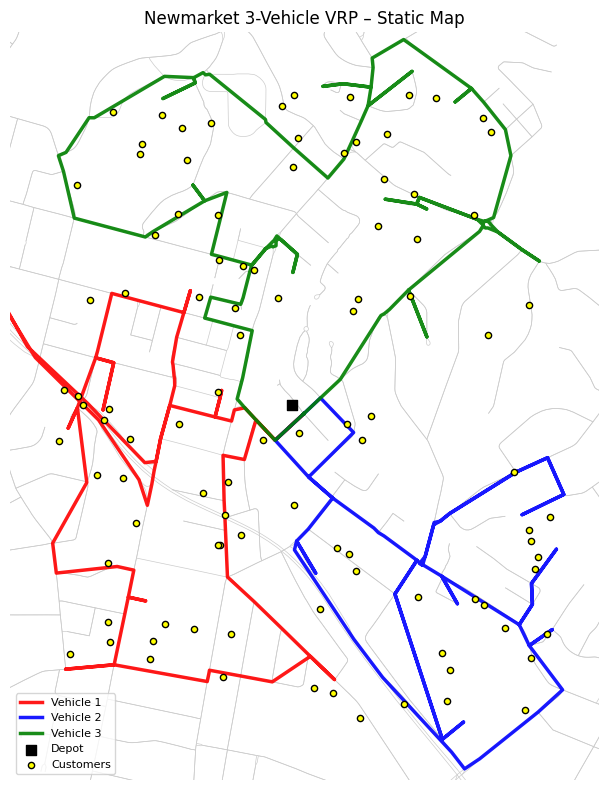

In [28]:
# ============================================
# Step 11: Static (non-interactive) map with all elements
# ============================================
import matplotlib.pyplot as plt
import osmnx as ox

# Base road network (static)
fig, ax = ox.plot_graph(
    G,
    node_size=0,
    edge_color="#cccccc",
    edge_linewidth=0.5,
    bgcolor="white",
    show=False,
    close=False,
    figsize=(8, 8),
)

# --- (A) Plot each vehicle route ---
route_colors = ["red", "blue", "green"]

for rid, route_nodes in enumerate(routes_on_graph):
    xs = [G.nodes[n]["x"] for n in route_nodes]  # lon
    ys = [G.nodes[n]["y"] for n in route_nodes]  # lat
    ax.plot(
        xs,
        ys,
        color=route_colors[rid % len(route_colors)],
        linewidth=2.5,
        label=f"Vehicle {rid + 1}",
        alpha=0.9,
    )

# --- (B) Plot depot and customers ---
depot = df_all.loc[0]
ax.scatter(
    depot["lon"],
    depot["lat"],
    c="black",
    s=60,
    marker="s",
    zorder=5,
    label="Depot",
)

ax.scatter(
    df_all.loc[1:, "lon"],
    df_all.loc[1:, "lat"],
    c="yellow",
    edgecolors="black",
    s=20,
    marker="o",
    zorder=4,
    label="Customers",
)

# --- (C) ZOOM: set axis limits around customers + depot ---
# Get min/max lon/lat of all points
xmin = df_all["lon"].min()
xmax = df_all["lon"].max()
ymin = df_all["lat"].min()
ymax = df_all["lat"].max()

# Add a small margin (10%) so routes are not on the border
x_margin = (xmax - xmin) * 0.1
y_margin = (ymax - ymin) * 0.1

ax.set_xlim(xmin - x_margin, xmax + x_margin)
ax.set_ylim(ymin - y_margin, ymax + y_margin)

# --- (D) Final styling ---
ax.set_title("Newmarket 3-Vehicle VRP – Static Map", fontsize=12)
ax.legend(loc="lower left", fontsize=8)

plt.tight_layout()
plt.show()

#fig.savefig("newmarket_vrp_3vehicles_static.png", dpi=300)


## To fix the Problem: Maps with customers location out reoutes

This is a map showing problem. As we using real roads for the distance matrix, our algorithm is fine.

In [34]:
import networkx as nx

# 1) Map PyVRP location IDs -> df_all row indices
#    locations = [depot] + clients  (from Step 6)
routes_df_indices = []   # each element: list of df_all indices, e.g. [0, 35, 12, 0]

for route in best.routes():
    visits = list(route.visits())   # list of *location indices* (ints)
    if not visits:                  # vehicle unused
        continue

    # depot is location index 0, clients are 1..n_locs-1
    # df_all is in the same order, so we can use these directly as row indices
    df_idx_seq = [0] + visits + [0]    # <-- NO +1 ANYMORE
    routes_df_indices.append(df_idx_seq)

print("Number of vehicle routes:", len(routes_df_indices))


Number of vehicle routes: 3


In [35]:
# 2) Rebuild routes_on_graph using these df indices
routes_on_graph = []

for df_idx_seq in routes_df_indices:
    node_seq = df_all.loc[df_idx_seq, "node_id"].astype(int).tolist()

    full_route_nodes = []
    for u, v in zip(node_seq[:-1], node_seq[1:]):
        try:
            seg = nx.shortest_path(G, u, v, weight="length")
            if full_route_nodes:
                full_route_nodes.extend(seg[1:])  # avoid repeating node
            else:
                full_route_nodes.extend(seg)
        except nx.NetworkXNoPath:
            print(f"No road path between nodes {u} and {v}")
    routes_on_graph.append(full_route_nodes)

print("Built", len(routes_on_graph), "graph-based routes.")


Built 3 graph-based routes.


In [36]:
# 3) Add snapped coordinates for plotting (on road centreline)
df_all["lon_snap"] = df_all["node_id"].apply(lambda nid: G.nodes[int(nid)]["x"])
df_all["lat_snap"] = df_all["node_id"].apply(lambda nid: G.nodes[int(nid)]["y"])

In [37]:
# 4) interactive map
# Center map on snapped depot location
center_lat = df_all.loc[0, "lat_snap"]
center_lon = df_all.loc[0, "lon_snap"]

m = folium.Map(location=[center_lat, center_lon],
               zoom_start=15,
               tiles="OpenStreetMap")

# ---- Draw the road network as grey lines ----
for u, v, key, data in G.edges(keys=True, data=True):
    if "geometry" in data:
        xs, ys = data["geometry"].xy
        coords = list(zip(ys, xs))   # (lat, lon)
    else:
        y1 = G.nodes[u]["y"]; x1 = G.nodes[u]["x"]
        y2 = G.nodes[v]["y"]; x2 = G.nodes[v]["x"]
        coords = [(y1, x1), (y2, x2)]

    folium.PolyLine(
        coords,
        color="#cccccc",
        weight=1,
        opacity=0.6,
    ).add_to(m)

# ---- Draw each vehicle route on the graph ----
route_colors = ["red", "blue", "green"]

for rid, route_nodes in enumerate(routes_on_graph):
    route_coords = [
        (G.nodes[n]["y"], G.nodes[n]["x"])  # (lat, lon)
        for n in route_nodes
    ]

    folium.PolyLine(
        route_coords,
        color=route_colors[rid % len(route_colors)],
        weight=5,
        opacity=0.9,
        tooltip=f"Vehicle {rid + 1}",
    ).add_to(m)

# ---- Depot + customers at snapped coordinates ----
for idx, row in df_all.iterrows():
    if idx == 0:
        folium.Marker(
            location=[row["lat_snap"], row["lon_snap"]],
            popup="Depot (0)",
            icon=folium.Icon(color="black", icon="home", prefix="fa"),
        ).add_to(m)
    else:
        folium.CircleMarker(
            location=[row["lat_snap"], row["lon_snap"]],
            radius=3,
            popup=f"Customer {int(row['location'])}",
            color="black",
            fill=True,
            fill_color="yellow",
            fill_opacity=0.9,
        ).add_to(m)

# Save & show
m.save("newmarket_vrp_3vehicles_corrected_interactive.html")
m

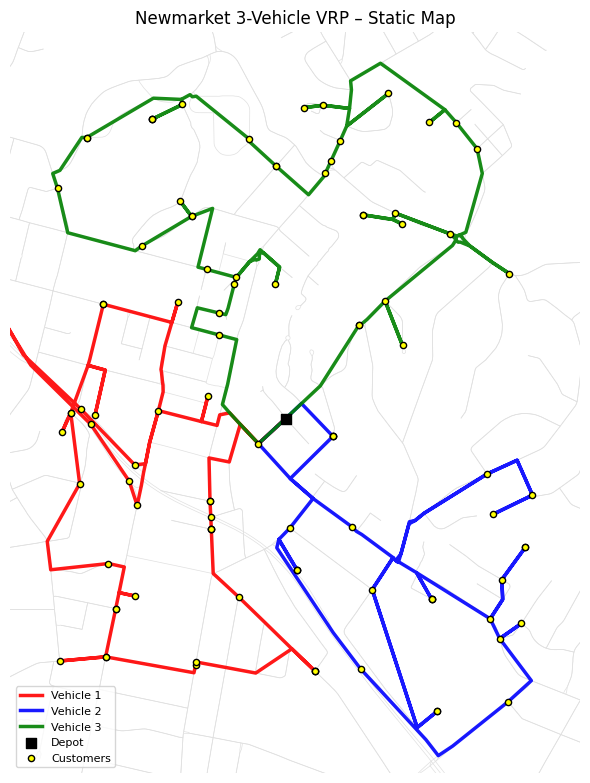

In [38]:
# Base road network
fig, ax = ox.plot_graph(
    G,
    node_size=0,
    edge_color="#e0e0e0",
    edge_linewidth=0.5,
    bgcolor="white",
    show=False,
    close=False,
    figsize=(6, 8),
)

# --- Plot routes ---
route_colors = ["red", "blue", "green"]

for rid, route_nodes in enumerate(routes_on_graph):
    xs = [G.nodes[n]["x"] for n in route_nodes]  # lon
    ys = [G.nodes[n]["y"] for n in route_nodes]  # lat
    ax.plot(
        xs,
        ys,
        color=route_colors[rid % len(route_colors)],
        linewidth=2.5,
        label=f"Vehicle {rid + 1}",
        alpha=0.9,
    )

# --- Plot depot & customers at snapped coords ---
depot = df_all.loc[0]
ax.scatter(
    depot["lon_snap"],
    depot["lat_snap"],
    c="black",
    s=50,
    marker="s",
    zorder=5,
    label="Depot",
)

ax.scatter(
    df_all.loc[1:, "lon_snap"],
    df_all.loc[1:, "lat_snap"],
    c="yellow",
    edgecolors="black",
    s=20,
    marker="o",
    zorder=4,
    label="Customers",
)

# --- Zoom to bounding box of snapped points ---
xmin = df_all["lon_snap"].min()
xmax = df_all["lon_snap"].max()
ymin = df_all["lat_snap"].min()
ymax = df_all["lat_snap"].max()

x_margin = (xmax - xmin) * 0.1
y_margin = (ymax - ymin) * 0.1

ax.set_xlim(xmin - x_margin, xmax + x_margin)
ax.set_ylim(ymin - y_margin, ymax + y_margin)

ax.set_title("Newmarket 3-Vehicle VRP – Static Map", fontsize=12)
ax.legend(loc="lower left", fontsize=8)

plt.tight_layout()
plt.show()


# The pervious steps still not work for the mapping shows, it just marge points to the closest roads and some nest points even overlapping into one points

